
# Notebook 1: Exploratory Data Analysis and Dataset Overview

Welcome to Notebook 1 of our anime recommendation system project!

The primary objective of this notebook is to delve into the anime datasets, conducting an in-depth exploration and analysis. Our aim is to gain comprehensive insights into the dataset, including the distribution of anime titles, genres, user ratings, and other pertinent features. Through various visualizations such as plots and charts, we'll uncover underlying patterns and trends in the data.

By thoroughly exploring the dataset in this notebook, we'll pave the way for essential data preprocessing steps before transitioning to Notebook 2: Model Training.

[Access Notebook 2: Model Training here](https://github.com/fursuf1/LHL-FP-Anime-Recommendation/blob/main/FP2%20RM.ipynb)

Running through this initial notebook is pivotal to grasp the dataset's nuances and prepare the groundwork for subsequent model training. Let's embark on our data exploration journey!

# Importing libraries

In [1]:
#!pip install plotly

In [2]:
#!pip install wordcloud

In [3]:
#!pip install langdetect

In [4]:
# Essential libraries for data handling and visualization
import numpy as np
import pandas as pd

# Visualization tools
import plotly.express as px  # For interactive visualizations
import plotly.graph_objects as go  # For 3D plot visualization
import plotly.figure_factory as ff  # For additional figure support
from plotly.offline import init_notebook_mode, iplot  # Initializing and displaying plotly figures
init_notebook_mode(connected=True)  # Connecting Plotly to the notebook

# Additional tools for specific visualization elements
from wordcloud import WordCloud  # Creating word clouds
from langdetect import detect  # Language detection
from datetime import datetime  # Date/time manipulation

C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# # Loading our Dataset

In [5]:
# Adjusting column display settings to showcase up to 50 columns
pd.set_option('display.max_columns', 50)

In [6]:
# Loading the anime details dataset from the CSV file
df_anime = pd.read_csv('C:/Downloads/Chrome/DS/fp/dataset_2023/anime-dataset-2023.csv')

# Displaying the dataset's shape (rows, columns) and showcasing the initial 3 rows for a glimpse into the data
print("Shape of the Dataset:", df_anime.shape)
df_anime.head(3)

Shape of the Dataset: (24905, 24)


,anime_id,Name,English name,Other name,Score,Genres,Synopsis,Type,Episodes,Aired,Premiered,Status,Producers,Licensors,Studios,Source,Duration,Rating,Rank,Popularity,Favorites,Scored By,Members,Image URL
0,1,Cowboy Bebop,Cowboy Bebop,カウボーイビバップ,8.75,"Action, Award Winning, Sci-Fi","Crime is timeless. By the year 2071, humanity ...",TV,26.0,"Apr 3, 1998 to Apr 24, 1999",spring 1998,Finished Airing,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min per ep,R - 17+ (violence & profanity),41.0,43,78525,914193.0,1771505,https://cdn.myanimelist.net/images/anime/4/196...
1,5,Cowboy Bebop: Tengoku no Tobira,Cowboy Bebop: The Movie,カウボーイビバップ 天国の扉,8.38,"Action, Sci-Fi","Another day, another bounty—such is the life o...",Movie,1.0,"Sep 1, 2001",UNKNOWN,Finished Airing,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr 55 min,R - 17+ (violence & profanity),189.0,602,1448,206248.0,360978,https://cdn.myanimelist.net/images/anime/1439/...
2,6,Trigun,Trigun,トライガン,8.22,"Action, Adventure, Sci-Fi","Vash the Stampede is the man with a $$60,000,0...",TV,26.0,"Apr 1, 1998 to Sep 30, 1998",spring 1998,Finished Airing,Victor Entertainment,"Funimation, Geneon Entertainment USA",Madhouse,Manga,24 min per ep,PG-13 - Teens 13 or older,328.0,246,15035,356739.0,727252,https://cdn.myanimelist.net/images/anime/7/203...


In [7]:
# Loading the user details dataset from the provided file path
df_user = pd.read_csv('C:/Downloads/Chrome/DS/fp/dataset_2023/users-details-2023.csv')

# Checking and displaying the dataset's shape (rows, columns) along with the first few rows
print("Shape of the Dataset:", df_user.shape)
df_user.head()

Shape of the Dataset: (731290, 16)


,Mal ID,Username,Gender,Birthday,Location,Joined,Days Watched,Mean Score,Watching,Completed,On Hold,Dropped,Plan to Watch,Total Entries,Rewatched,Episodes Watched
0,1,Xinil,Male,1985-03-04T00:00:00+00:00,California,2004-11-05T00:00:00+00:00,142.3,7.37,1.0,233.0,8.0,93.0,64.0,399.0,60.0,8458.0
1,3,Aokaado,Male,NaN,"Oslo, Norway",2004-11-11T00:00:00+00:00,68.6,7.34,23.0,137.0,99.0,44.0,40.0,343.0,15.0,4072.0
2,4,Crystal,Female,NaN,"Melbourne, Australia",2004-11-13T00:00:00+00:00,212.8,6.68,16.0,636.0,303.0,0.0,45.0,1000.0,10.0,12781.0
3,9,Arcane,NaN,NaN,NaN,2004-12-05T00:00:00+00:00,30.0,7.71,5.0,54.0,4.0,3.0,0.0,66.0,0.0,1817.0
4,18,Mad,NaN,NaN,NaN,2005-01-03T00:00:00+00:00,52.0,6.27,1.0,114.0,10.0,5.0,23.0,153.0,42.0,3038.0


In [8]:
# Loading the user score dataset from the provided file path
df_score = pd.read_csv('C:/Downloads/Chrome/DS/fp/dataset_2023/users-score-2023.csv')

# Checking and displaying the dataset's shape (rows, columns) along with the first few rows
print("Shape of the dataset:", df_score.shape)
df_score.head()

Shape of the dataset: (24325191, 5)


,user_id,Username,anime_id,Anime Title,rating
0,1,Xinil,21,One Piece,9
1,1,Xinil,48,.hack//Sign,7
2,1,Xinil,320,A Kite,5
3,1,Xinil,49,Aa! Megami-sama!,8
4,1,Xinil,304,Aa! Megami-sama! Movie,8


# Explorartory Data Analysis

## Data Exploration

#### Checking Each Dataframes
In order to gain a better understanding of the data, it is important to examine each DataFrame individually. This includes assessing its structure and identifying any missing values. We will begin this process by using the info() method, which provides a comprehensive overview of the DataFrame's columns and structure.

In [9]:
# Displaying information about the anime details dataset
df_anime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24905 entries, 0 to 24904
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   anime_id      24905 non-null  int64 
 1   Name          24905 non-null  object
 2   English name  24905 non-null  object
 3   Other name    24905 non-null  object
 4   Score         24905 non-null  object
 5   Genres        24905 non-null  object
 6   Synopsis      24905 non-null  object
 7   Type          24905 non-null  object
 8   Episodes      24905 non-null  object
 9   Aired         24905 non-null  object
 10  Premiered     24905 non-null  object
 11  Status        24905 non-null  object
 12  Producers     24905 non-null  object
 13  Licensors     24905 non-null  object
 14  Studios       24905 non-null  object
 15  Source        24905 non-null  object
 16  Duration      24905 non-null  object
 17  Rating        24905 non-null  object
 18  Rank          24905 non-null  object
 19  Popu

In [10]:
# Checking the value counts of the 'Score' column in the anime details dataset
df_anime['Score'].value_counts()

UNKNOWN    9213
6.31         80
6.54         80
6.25         79
6.51         79
           ... 
3.21          1
3.29          1
1.85          1
3.69          1
4.07          1
Name: Score, Length: 567, dtype: int64

In [11]:
# Extracting valid scores from the 'Score' column
scores = df_anime['Score'][df_anime['Score'] != 'UNKNOWN']

# Converting scores to a floating-point format
scores = scores.astype('float')

# Calculating the mean score
score_mean = round(scores.mean(), 2)

In [12]:
# Replace 'UNKNOWN' scores with the calculated mean score
df_anime['Score'] = df_anime['Score'].replace('UNKNOWN', score_mean)

# Convert the 'Score' column to float64
df_anime['Score'] = df_anime['Score'].astype('float64')

In [13]:
# Check the unique values in the 'Ranked' column
df_anime['Rank'].value_counts()

UNKNOWN    4612
0.0         187
6542.0        4
16675.0       4
6577.0        4
           ... 
18424.0       1
18423.0       1
11642.0       1
8977.0        1
14536.0       1
Name: Rank, Length: 15198, dtype: int64

In [14]:
# Replacing 'UNKNOWN' entries with NaN in the 'Rank' column
df_anime['Rank'] = df_anime['Rank'].replace('UNKNOWN', np.nan)

# Converting the 'Rank' column to float64 for numerical operations
df_anime['Rank'] = df_anime['Rank'].astype('float64')

In [15]:
# Displaying information about the 'User' DataFrame
df_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731290 entries, 0 to 731289
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Mal ID            731290 non-null  int64  
 1   Username          731290 non-null  object 
 2   Gender            224383 non-null  object 
 3   Birthday          168068 non-null  object 
 4   Location          152806 non-null  object 
 5   Joined            731290 non-null  object 
 6   Days Watched      731282 non-null  float64
 7   Mean Score        731282 non-null  float64
 8   Watching          731282 non-null  float64
 9   Completed         731282 non-null  float64
 10  On Hold           731282 non-null  float64
 11  Dropped           731282 non-null  float64
 12  Plan to Watch     731282 non-null  float64
 13  Total Entries     731282 non-null  float64
 14  Rewatched         731282 non-null  float64
 15  Episodes Watched  731282 non-null  float64
dtypes: float64(10), int6

In [16]:
# Check for missing values in the 'df_score' DataFrame
# Sum up the count of missing values column-wise
df_score.isnull().sum()

user_id        0
Username       0
anime_id       0
Anime Title    0
rating         0
dtype: int64

## Data Visualization

### Exploring Anime Dataset

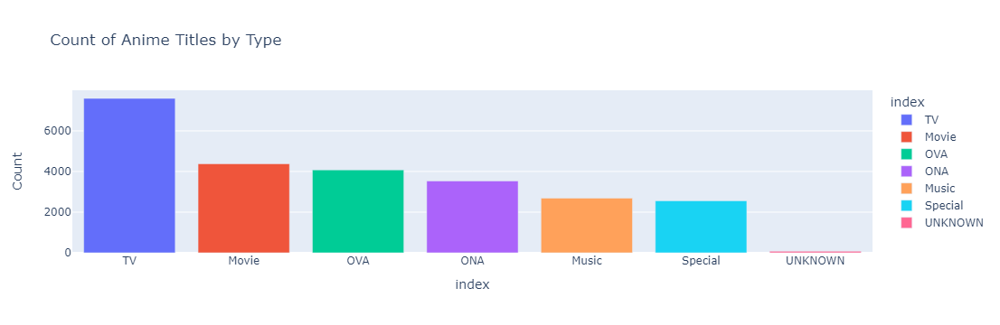

In [17]:
# Count the occurrences of each anime type and store the result in 'type_counts'
type_counts = df_anime['Type'].value_counts()

# Create a bar chart using Plotly Express (px)
# Set the x-axis as the different anime types, y-axis as their respective counts
# Color the bars based on the anime types
# Set labels for x and y axes, and provide a title for the chart
fig = px.bar(type_counts, x=type_counts.index, y=type_counts.values, color=type_counts.index,
             labels={'x':'Anime Type', 'y':'Count'}, title='Count of Anime Titles by Type')

# Display the bar chart
fig.show()

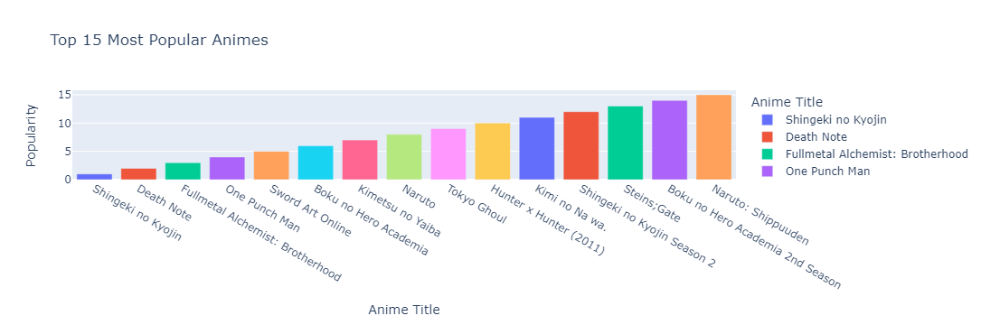

In [18]:
# Filter out anime titles with a popularity value greater than 0
# This will create a new DataFrame with anime having a positive popularity value
df_valid_popularity = df_anime[df_anime['Popularity'] > 0]

# Sort the DataFrame by 'Popularity' in ascending order and select the top 15 most popular animes
top_10_popular = df_valid_popularity.sort_values(by='Popularity', ascending=True).head(15)

# Create a bar chart using Plotly Express (px)
# Set 'Name' as the x-axis (anime titles), 'Popularity' as the y-axis (popularity values),
# Label the x and y axes accordingly, set the title for the chart, and color the bars based on anime titles
fig = px.bar(top_10_popular, x='Name', y='Popularity',
             labels={'Name': 'Anime Title', 'Popularity': 'Popularity'},
             title='Top 15 Most Popular Animes',
             color='Name')

# Display the bar chart
fig.show()

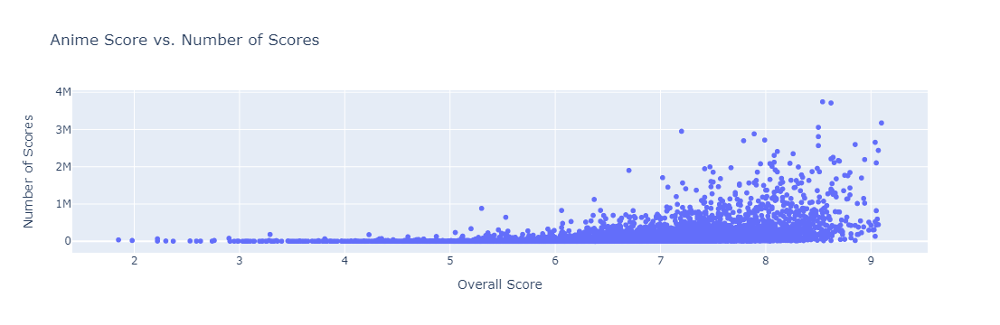

In [19]:
# Create a scatter plot using Plotly Express (px)
# The x-axis represents the 'Score' of the anime, and the y-axis represents the number of 'Members' who scored
# Label the x and y axes accordingly, set the title for the plot
fig = px.scatter(df_anime, x='Score', y='Members', 
                 labels={'Score':'Overall Score', 'Members':'Number of Scores'}, 
                 title='Anime Score vs. Number of Scores')

# Display the scatter plot
fig.show()

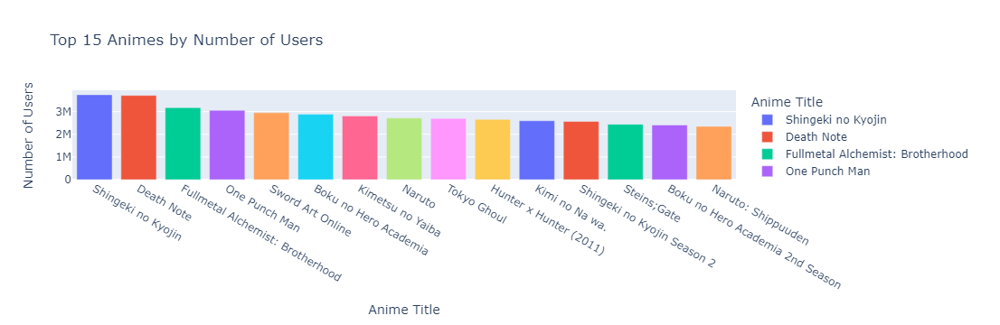

In [20]:
# Sort the anime dataframe by the number of users who have scored the anime in descending order and select the top 15
top_15_scored = df_anime.sort_values(by='Members', ascending=False).head(15)

# Create a bar chart using Plotly Express (px)
# The x-axis represents the 'Name' of the anime, and the y-axis represents the 'Members' or the number of users who scored the anime
# Label the x and y axes accordingly, set the title for the plot
fig = px.bar(top_15_scored, x='Name', y='Members', 
             labels={'Members':'Number of Users', 'Name':'Anime Title'}, color='Name',
             title='Top 15 Animes by Number of Users')

# Display the bar chart
fig.show()

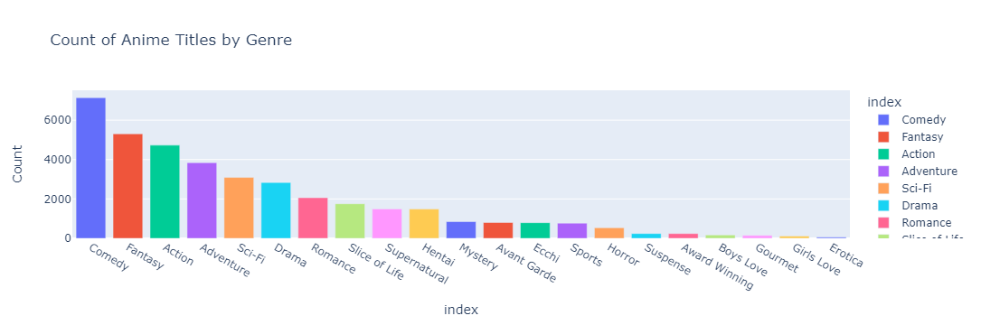

In [21]:
# Filter out rows where the 'Genres' column is not labeled as 'UNKNOWN', split the genres, and count their occurrences
genre_counts = df_anime[df_anime['Genres'] != "UNKNOWN"]['Genres'].apply(lambda x: x.split(', ')).explode().value_counts()

# Create a bar chart using Plotly Express (px)
# The x-axis represents the different genres, and the y-axis represents the count of each genre
# Label the x and y axes accordingly, set the title for the plot, and color the bars based on genre
fig = px.bar(genre_counts, x=genre_counts.index, y=genre_counts.values,
             labels={'x':'Genre', 'y':'Count'},
             title='Count of Anime Titles by Genre',
             color=genre_counts.index)

# Display the bar chart
fig.show()

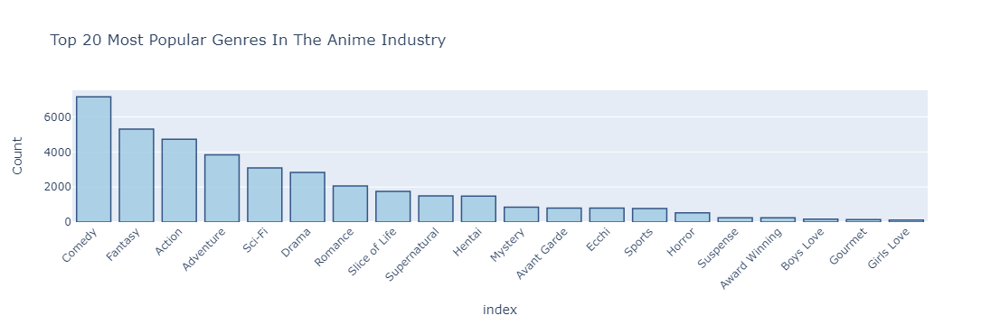

In [22]:
# Select the top 20 genres based on their occurrence count
top_20_genres = genre_counts.head(20)

# Create a bar chart using Plotly Express (px) for the top 20 genres
# The x-axis represents the genres, and the y-axis represents their respective count
# Customize the x and y-axis labels, set the title for the plot
fig = px.bar(top_20_genres, x=top_20_genres.index, y=top_20_genres.values,
             labels={'x':'Genre', 'y':'Count'},
             title='Top 20 Most Popular Genres In The Anime Industry')

# Customize the appearance of the bar chart
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',  # Setting bar colors
                  marker_line_width=1.5, opacity=0.8)  # Adjusting marker line width and opacity

# Rotate x-axis labels for better readability and adjust font sizes for axis titles
fig.update_layout(xaxis_tickangle=-45, xaxis=dict(tickfont=dict(size=12)),
                  yaxis=dict(titlefont=dict(size=14)))

# Display the customized bar chart
fig.show()

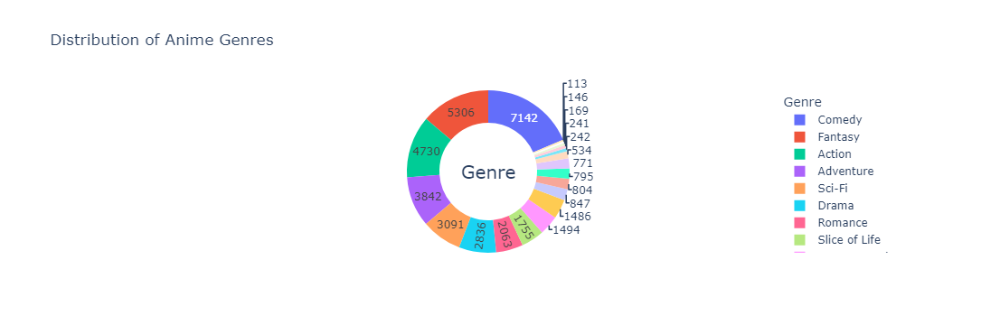

In [23]:
# Create a Plotly figure for a pie chart representation of genre distribution
fig = go.Figure(data=[go.Pie(
    labels=top_20_genres.index,  # Genre labels for the pie chart
    values=top_20_genres.values,  # Count of each genre in the dataset
    hole=0.6,  # Size of the central hole in the pie chart (for donut chart effect)
    hoverinfo='label+percent',  # Information displayed on hover (label and percentage)
    textinfo='value'  # Information displayed inside each pie slice (the count of each genre)
)])

# Update the layout and styling of the pie chart
fig.update_layout(
    title='Distribution of Anime Genres',  # Title for the pie chart
    legend=dict(font=dict(size=12), title='Genre'),  # Styling for the legend
    annotations=[dict(text='Genre', x=0.5, y=0.5, font_size=20, showarrow=False)]  # Annotations for the chart
)

# Display the pie chart figure
fig.show()

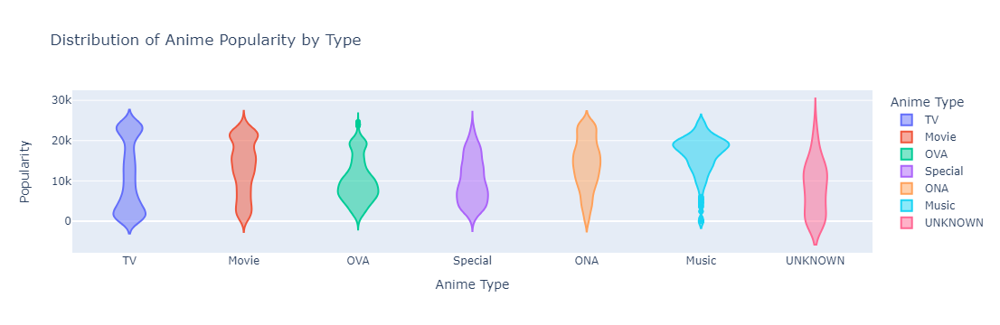

In [25]:
# Create a violin plot for anime popularity by type using Plotly Express
fig = px.violin(df_anime,  # DataFrame containing the data
                x='Type',  # X-axis represents the different types of anime
                y='Popularity',  # Y-axis represents the popularity scores
                labels={'Type': 'Anime Type', 'Popularity': 'Popularity'},  # Labels for axes
                title='Distribution of Anime Popularity by Type',  # Title of the plot
                color='Type')  # Color distinction based on anime type

# Display the violin plot
fig.show()

In [ ]:
# Concatenate all genre values into a single string
genre_text = ' '.join(df_anime[df_anime['Genres'] != "UNKNOWN"]['Genres'].dropna())

# Create a WordCloud object with specified dimensions and background color
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(genre_text)

# Convert the WordCloud object to an image
wordcloud_image = wordcloud.to_image()

# Create a Plotly figure to display the WordCloud image
fig = go.Figure(go.Image(z=wordcloud_image))

# Set the title for the plot
fig.update_layout(title='Word Embedding Plot - Genre')

# Display the WordCloud image as a Plotly figure
fig.show()

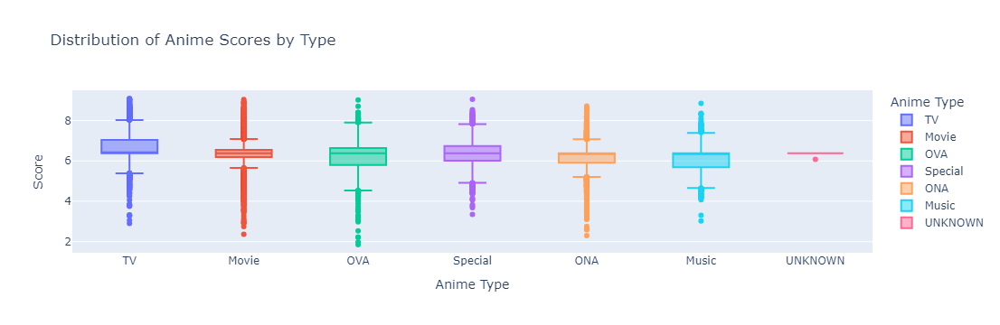

In [26]:
# Create a box plot for anime scores by type using Plotly Express
fig = px.box(df_anime,  # DataFrame containing the data
             x='Type',   # X-axis represents the different types of anime
             y='Score',  # Y-axis represents the scores of anime
             labels={'Type': 'Anime Type', 'Score': 'Score'},  # Labels for axes
             title='Distribution of Anime Scores by Type',  # Title of the plot
             color='Type')  # Color distinction based on anime type

# Display the box plot
fig.show()

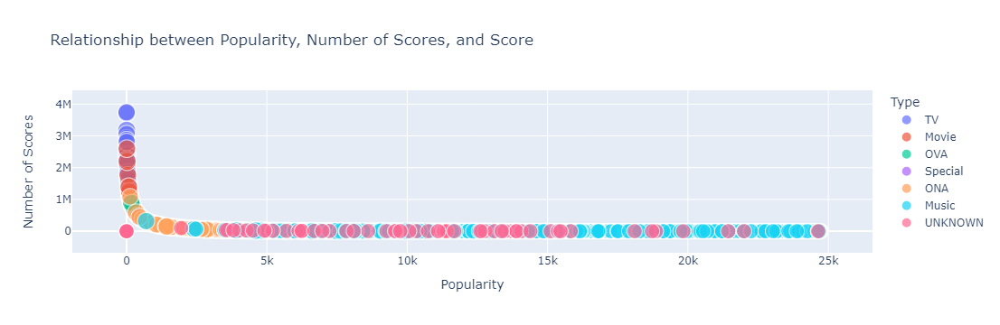

In [27]:
# Create a bubble chart to visualize relationships using Plotly Express
fig = px.scatter(
    df_anime,        # DataFrame containing the data
    x='Popularity',  # X-axis represents the 'Popularity' of anime
    y='Members',     # Y-axis represents the 'Members' (number of scores)
    size='Score',    # Bubble size represents the 'Score' of anime
    color='Type',    # Color differentiation based on the 'Type' of anime
    labels={'Popularity':'Popularity', 'Members':'Number of Scores'},  # Labels for axes
    title='Relationship between Popularity, Number of Scores, and Score'  # Title of the plot
)

# Display the bubble chart
fig.show()

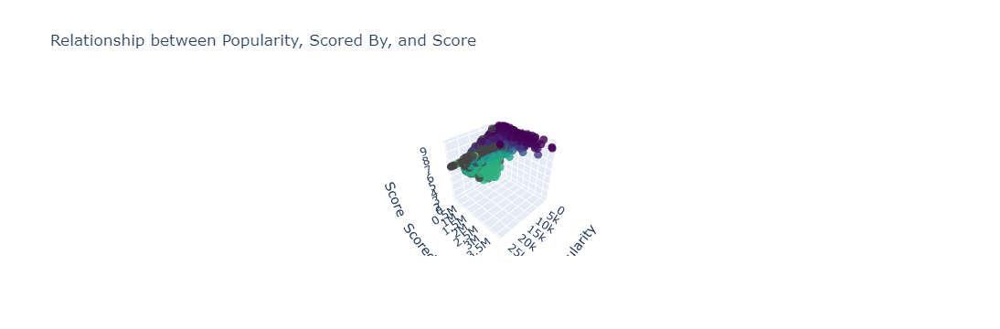

In [28]:
# Create a 3D scatter plot using Plotly's Graph Objects (go)
fig = go.Figure(data=go.Scatter3d(
    x=df_anime['Popularity'],  # X-axis represents 'Popularity' data from the DataFrame
    y=df_anime['Members'],     # Y-axis represents 'Members' (number of scores) data
    z=df_anime['Score'],       # Z-axis represents 'Score' data
    mode='markers',            # Sets the mode to markers for a scatter plot
    marker=dict(               # Marker properties for customization
        size=5,                # Marker size
        color=df_anime['Rank'],  # Marker color based on 'Rank' values
        colorscale='Viridis',  # Color scale for visualization
        opacity=0.8            # Marker opacity
    ),
    text=df_anime['Name'],     # Text displayed when hovering over markers
    hovertemplate='<b>Title</b>: %{text}<br><b>Popularity</b>: %{x}<br><b>Scored By</b>: %{y}<br><b>Score</b>: %{z}',  # Template for hover information
))

# Update layout settings for the 3D scatter plot
fig.update_layout(scene=dict(
    xaxis_title='Popularity',  # Title for the X-axis
    yaxis_title='Scored By',   # Title for the Y-axis
    zaxis_title='Score'        # Title for the Z-axis
), title='Relationship between Popularity, Scored By, and Score')  # Title of the plot

# Show the 3D scatter plot
fig.show()

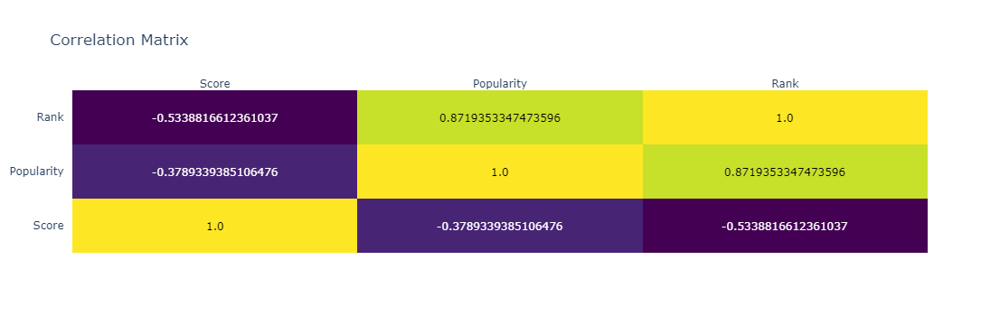

In [29]:
# Calculate the correlation matrix using specific columns
correlation_matrix = df_anime[['Score', 'Popularity', 'Rank']].corr()

# Create an annotated heatmap using Plotly's figure factory (ff)
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,  # Values for the heatmap cells from the correlation matrix
    x=list(correlation_matrix.columns),  # X-axis labels from the column names of the correlation matrix
    y=list(correlation_matrix.index),    # Y-axis labels from the index of the correlation matrix
    colorscale='Viridis'  # Color scale for the heatmap
)

# Update layout settings for the heatmap
fig.update_layout(title='Correlation Matrix')  # Set the title for the heatmap

# Show the annotated heatmap
fig.show()

In [30]:
# Count the occurrences of different licensors in the 'Licensors' column
licensors_count = df_anime['Licensors'].value_counts()
licensors_count

UNKNOWN                                                                  20170
Funimation                                                                 957
Sentai Filmworks                                                           818
Discotek Media                                                             275
Aniplex of America                                                         222
                                                                         ...  
Bandai Entertainment, Maiden Japan                                           1
ADV Films, SoftCel Pictures                                                  1
VIZ Media, Media Blasters, Sentai Filmworks, Geneon Entertainment USA        1
Bandai Entertainment, Discotek Media, NYAV Post, Bandai Visual USA           1
Bandai Namco Online                                                          1
Name: Licensors, Length: 265, dtype: int64

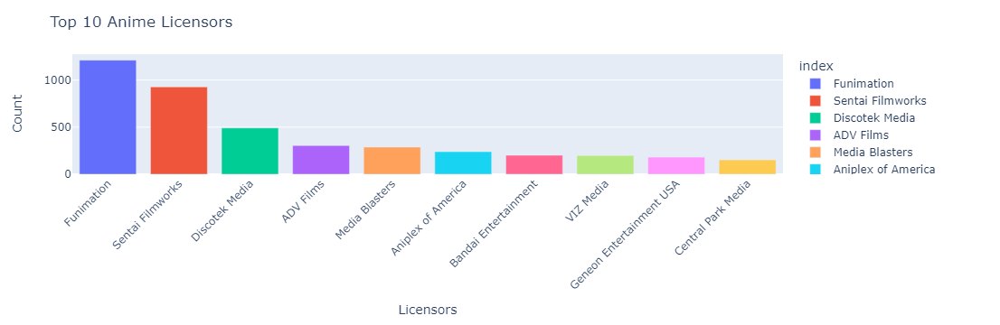

In [31]:
# Extract individual licensors from the 'Licensors' column, excluding 'UNKNOWN'
individual_licensors = [
    licensor.strip() for licensors in df_anime[df_anime['Licensors'] != "UNKNOWN"]['Licensors'].str.split(',') for licensor in licensors
]
# Iterates through each entry, separating multiple licensors for a single title,
# and stores individual licensor names in 'individual_licensors'

# Count the occurrences of each licensor
licensor_counts = pd.Series(individual_licensors).value_counts()
# Generates a pandas Series with counts for each unique licensor

# Filter out the 'Unknown' licensor from the count
filtered_licensor_counts = licensor_counts[licensor_counts.index != 'Unknown']
# Removes the 'Unknown' licensor count from the series

# Select the top 10 licensors based on their counts
top_15_licensors = filtered_licensor_counts.head(10)
# Retrieves the top 10 licensors with the highest counts

# Create a bar plot using Plotly
fig = px.bar(top_15_licensors, x=top_15_licensors.index, y=top_15_licensors.values, color=top_15_licensors.index)
# Creates a bar plot visualizing the top 10 licensors and their counts

# Customize the plot layout
fig.update_layout(
    title='Top 10 Anime Licensors',
    xaxis_title='Licensors',
    yaxis_title='Count',
    xaxis_tickangle=-45
)
# Adjusts the plot's title, axis labels, and rotation for readability

# Show the plot
fig.show()

In [32]:
# Count the occurrences of Premiered values
premiered_counts = df_anime['Premiered'].value_counts()
# Generates a count for each unique Premiered value in the DataFrame

# Display the counts of Premiered values
premiered_counts
# Outputs the counts of Premiered values in the dataset

UNKNOWN        19399
spring 2017       88
fall 2016         83
spring 2018       81
spring 2016       78
               ...  
summer 1993        1
summer 1974        1
summer 1991        1
spring 1961        1
summer 2025        1
Name: Premiered, Length: 244, dtype: int64

In [33]:
# Function to extract the season and year from the premiered string
def extract_season_year(premiered):
    if premiered == 'UNKNOWN':  # Checks if the premiered value is 'UNKNOWN'
        return None, None  # Returns None for both season and year if the value is 'UNKNOWN'
    else:
        season, year = premiered.split()  # Splits the premiered string into season and year
        return season, int(year)  # Returns the extracted season and converted year as integers

# Apply the function to extract the season and year from the "Premiered" column
season_year = df_anime['Premiered'].map(extract_season_year)
# Maps the extract_season_year function to the 'Premiered' column, extracting season and year
premiered_season = season_year.apply(lambda x: x[0])  # Extracts the season from the extracted data
premiered_Year = season_year.apply(lambda x: x[1])  # Extracts the year from the extracted data

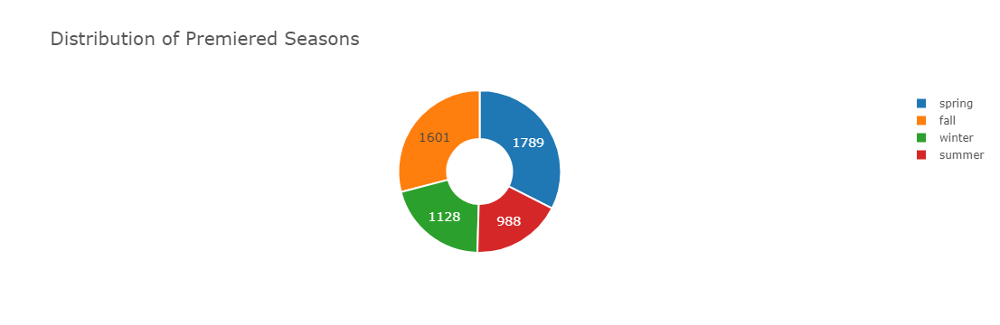

In [34]:
# Filter out None values from premiered_season
filtered_premiered_season = premiered_season.dropna()
# Drops missing values from the premiered_season column

# Count the occurrences of each season
season_counts = filtered_premiered_season.value_counts()
# Counts the occurrences of each season in the filtered data

# Create the pie plot using Plotly
fig = go.Figure(data=go.Pie(
    labels=season_counts.index,  # Sets the labels for the pie chart slices
    values=season_counts.values,  # Sets the values for the pie chart slices
    hole=0.4,  # Adds a donut hole in the center of the pie chart
    hoverinfo='label+percent',  # Shows label and percentage on hover
    textinfo='value',  # Displays count value as text inside each slice
    textfont=dict(size=14),  # Sets the text font size
    marker=dict(
        colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'],  # Custom color palette for slices
        line=dict(color='#ffffff', width=2)  # Sets the color and width of the slice borders
    )
))

# Set the title and font style for the plot
fig.update_layout(
    title='Distribution of Premiered Seasons',  # Sets the plot title
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555')  # Sets the font size and color for the plot
)

fig.show()

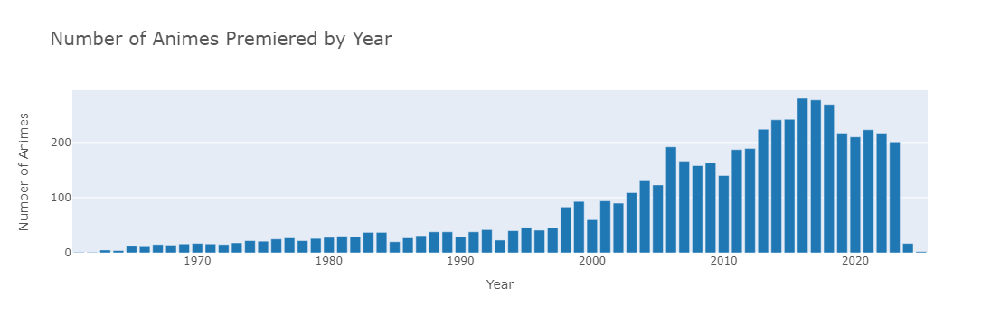

In [35]:
# Filter out None values from premiered_Year
filtered_premiered_year = premiered_Year.dropna()
# Drops missing values from the premiered_Year column

# Count the occurrences of each year
year_counts = filtered_premiered_year.value_counts()
# Counts the occurrences of each year in the filtered data

# Sort the years in ascending order
sorted_years = sorted(year_counts.index)
# Sorts the years in ascending order for better visualization

# Create the bar plot using Plotly
fig = go.Figure(data=go.Bar(
    x=sorted_years,  # Sets the x-values as sorted years
    y=year_counts[sorted_years],  # Sets the y-values based on the sorted years
    marker=dict(color='#1f77b4'),  # Sets the color of the bars
))

# Set the title and axis labels for the plot
fig.update_layout(
    title='Number of Animes Premiered by Year',  # Sets the plot title
    xaxis_title='Year',  # Sets the label for the x-axis
    yaxis_title='Number of Animes',  # Sets the label for the y-axis
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555')  # Sets the font size and color for the plot
)

fig.show()

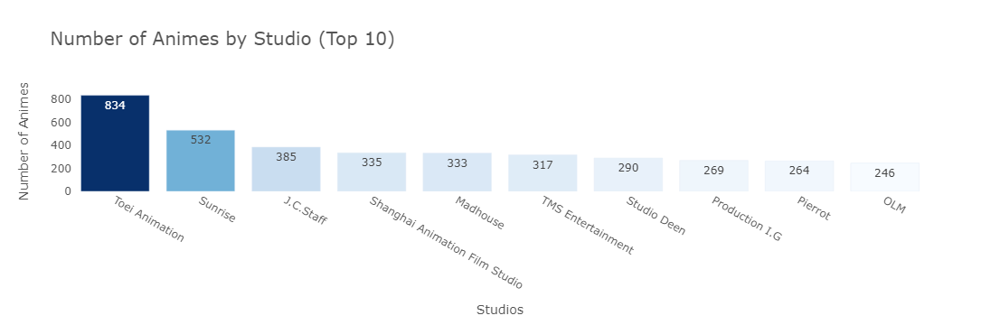

In [36]:
# Count the occurrences of each studio
studio_counts = df_anime['Studios'].value_counts()
# Counts the occurrences of each studio in the dataset

# Filter the studio_counts series to exclude 'Unknown'
studio_counts = studio_counts[studio_counts.index != 'UNKNOWN']
# Removes the 'UNKNOWN' studios from the count data

# Select the top 10 studios with the highest number of animes
top_studios = studio_counts.head(10)
# Retrieves the top 10 studios with the highest number of animes produced

# Create the bar plot using Plotly
fig = go.Figure(data=go.Bar(
    x=top_studios.index,  # Sets the x-values as studio names
    y=top_studios.values,  # Sets the y-values as the number of animes for each studio
    marker=dict(color=top_studios.values, colorscale='Blues'),  # Sets the color of the bars using a colorscale
    text=top_studios.values,  # Sets the text to be displayed on hover
    hovertemplate='Studio: %{x}<br>Number of Animes: %{y}<extra></extra>',  # Customizes the hover template
))

# Set the title and axis labels for the plot
fig.update_layout(
    title='Number of Animes by Studio (Top 10)',  # Sets the plot title
    xaxis_title='Studios',  # Sets the label for the x-axis
    yaxis_title='Number of Animes',  # Sets the label for the y-axis
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555'),  # Sets the font size and color for the plot
    plot_bgcolor='rgba(0, 0, 0, 0)'  # Sets the background color to transparent
)

fig.show()

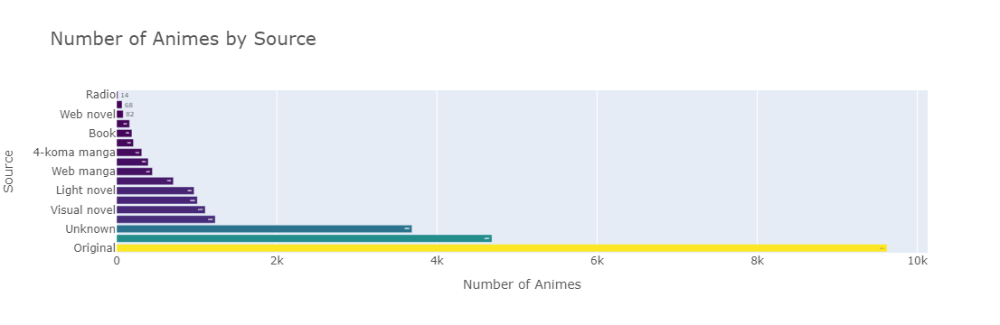

In [37]:
# Count the occurrences of each source in the 'Source' column
source_counts = df_anime['Source'].value_counts()
# Counts the occurrences of each anime source

# Filter the source_counts series to exclude 'UNKNOWN' sources
source_counts = source_counts[source_counts.index != 'UNKNOWN']
# Removes the 'UNKNOWN' sources from the count data

# Create a horizontal bar chart using Plotly
fig = go.Figure(data=go.Bar(
    x=source_counts.values,  # Sets the x-values as the counts of animes for each source
    y=source_counts.index,  # Sets the y-values as the sources
    orientation='h',  # Sets the orientation of the bars to horizontal
    marker=dict(color=source_counts.values, colorscale='Viridis'),  # Sets the color of the bars using a colorscale
    text=source_counts.values,  # Sets the text to be displayed on hover
    hovertemplate='Source: %{y}<br>Number of Animes: %{x}<extra></extra>',  # Customizes the hover template
))

# Set the title and axis labels for the plot
fig.update_layout(
    title='Number of Animes by Source',  # Sets the plot title
    xaxis_title='Number of Animes',  # Sets the label for the x-axis
    yaxis_title='Source',  # Sets the label for the y-axis
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555')  # Sets the font size and color for the plot
)

fig.show()

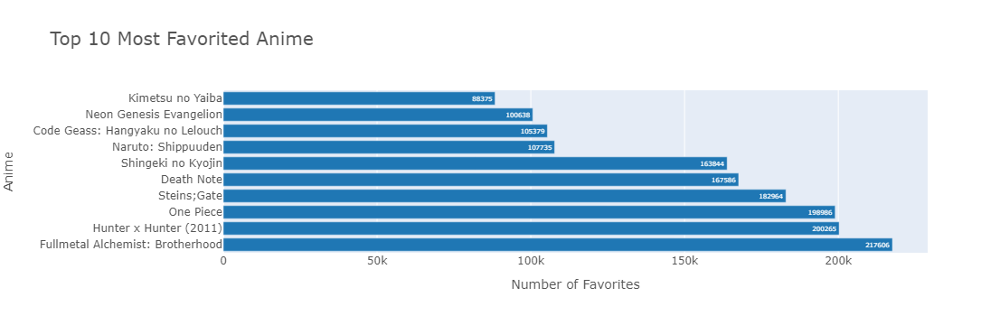

In [38]:
# Sort the DataFrame by the 'Favorites' column in descending order
sorted_df = df_anime.sort_values('Favorites', ascending=False)
# Sorts the DataFrame based on the number of favorites in descending order

# Select the top 10 most favorited anime from the sorted DataFrame
top_favorites = sorted_df.head(10)
# Selects the top 10 rows from the sorted DataFrame

# Create a horizontal bar chart using Plotly
fig = go.Figure(data=go.Bar(
    x=top_favorites['Favorites'],  # Sets the x-values as the number of favorites
    y=top_favorites['Name'],  # Sets the y-values as the names of the anime
    orientation='h',  # Sets the orientation of the bars to horizontal
    marker=dict(color='#1f77b4'),  # Sets the color of the bars
    text=top_favorites['Favorites'],  # Sets the text to be displayed on hover
    hovertemplate='Anime: %{y}<br>Favorites: %{x}<extra></extra>',  # Customizes the hover template
))

# Set the title and axis labels for the plot
fig.update_layout(
    title='Top 10 Most Favorited Anime',  # Sets the plot title
    xaxis_title='Number of Favorites',  # Sets the label for the x-axis
    yaxis_title='Anime',  # Sets the label for the y-axis
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555')  # Sets the font size and color for the plot
)

fig.show()

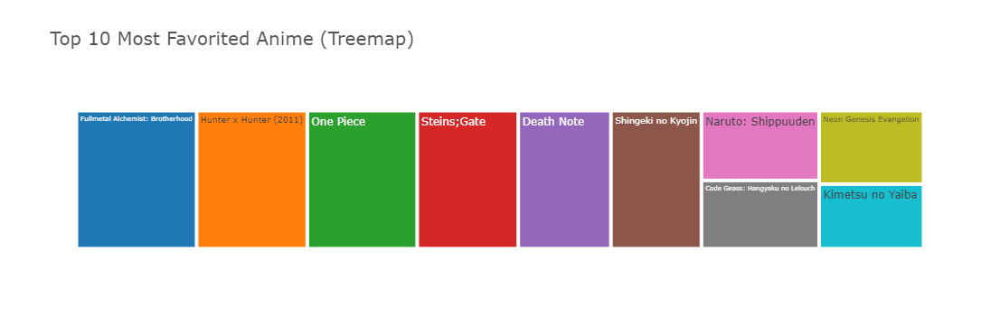

In [39]:
# Creating a treemap plot to visualize the top 10 most favorited anime
fig = go.Figure(go.Treemap(
    labels=top_favorites['Name'],  # Sets the labels for each treemap section as anime names
    parents=[""] * len(top_favorites),  # Sets empty parent values for all sections
    values=top_favorites['Favorites'],  # Sets the values (sizes) for each treemap section as number of favorites
    hovertemplate='Name: %{label}<br>Favorites: %{value}',  # Customizes the hover template
))

# Define custom colors for the treemap sections
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
fig.update_traces(marker=dict(colors=colors))  # Sets the colors for the treemap sections

# Set the title and font styles for the treemap plot
fig.update_layout(
    title='Top 10 Most Favorited Anime (Treemap)',  # Sets the plot title
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555'),  # Sets the font size and color for the plot
)

fig.show()  # Displays the treemap plot

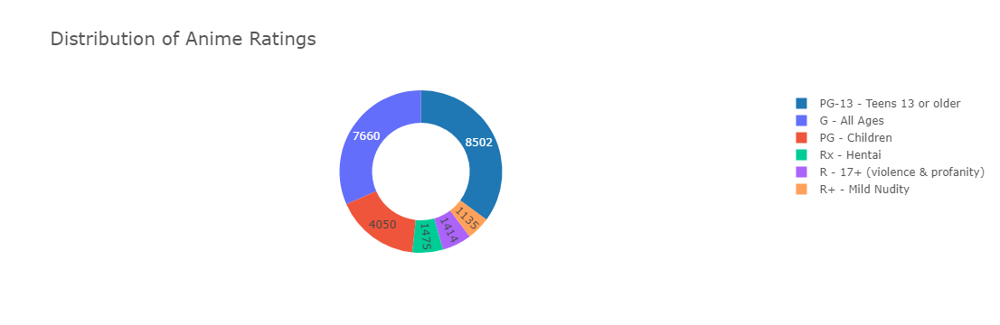

In [40]:
# Counting the occurrences of each rating excluding 'UNKNOWN'
rating_counts = df_anime[df_anime['Rating']!="UNKNOWN"]['Rating'].value_counts()

# Filtering the rating_counts series to exclude 'Unknown'
rating_counts = rating_counts[rating_counts.index != 'Unknown']

# Creating a pie plot to visualize the distribution of anime ratings
fig = go.Figure(data=go.Pie(
    labels=rating_counts.index,  # Sets the labels for each segment as different ratings
    values=rating_counts.values,  # Sets the values for each segment as the count of ratings
    hoverinfo='label+percent',  # Displays label and percentage on hover
    textinfo='value',  # Displays the count value as text inside each segment
    textfont=dict(size=12),  # Sets the font size for the text inside segments
    marker=dict(colors=['#1f77b4']),  # Sets the color for all segments
    hole=0.6,  # Sets the size of the inner hole to create a donut shape
))

# Setting the title and font styles for the pie plot
fig.update_layout(
    title='Distribution of Anime Ratings',  # Sets the plot title
    title_font=dict(size=20),  # Sets the font size for the title
    font=dict(size=12, color='#555555'),  # Sets the font size and color for the plot
)

fig.show()  # Displays the pie plot

In [41]:
# Function to map abbreviated language codes to full names
def map_language_code(code):
    # Dictionary mapping language codes to full names
    language_mapping = {
        'ja': 'Japanese',
        'ko': 'Korean',
        'zh-cn': 'Simplified Chinese',
        'de': 'German',
        'vi': 'Vietnamese',
        'en': 'English',
        'zh-tw': 'Traditional Chinese'
    }
    # Return the full name corresponding to the code, or 'Other' if not found
    return language_mapping.get(code, 'Other')

# Function to detect language
def detect_language(name):
    try:
        # Attempt to detect the language of the input name using the langdetect library
        return detect(name)
    except:
        return None  # Return None for rows where language detection fails

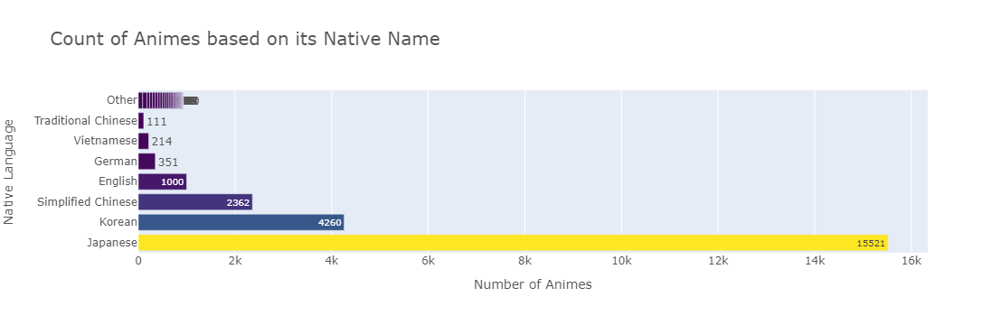

In [42]:
# Apply language detection to the 'Other name' column
Detected_Language = df_anime[df_anime['Other name'] != "UNKNOWN"]['Other name'].apply(detect_language)

# Drop rows where language detection failed (rows where Detected_Language is None)
Detected_Language = Detected_Language.dropna()

# Count the occurrences of each detected language
language_counts = Detected_Language.value_counts()

# Map abbreviated language codes to full names for plotting
language_counts.index = language_counts.index.map(map_language_code)

# Create a horizontal bar plot
fig = go.Figure(data=go.Bar(
    x=language_counts.values,
    y=language_counts.index,
    orientation='h',  # Set the orientation to horizontal
    marker=dict(color=language_counts.values, colorscale='Viridis'),  # Set colors using a colorscale
    text=language_counts.values,  # Set text for hover display
    hovertemplate='Native Language: %{y}<br>Number of Animes: %{x}<extra></extra>',  # Customize hover info
))

# Set the title and axis labels
fig.update_layout(
    title='Count of Animes based on its Native Name',
    xaxis_title='Number of Animes',
    yaxis_title='Native Language',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()

### Exploring Users Datasets

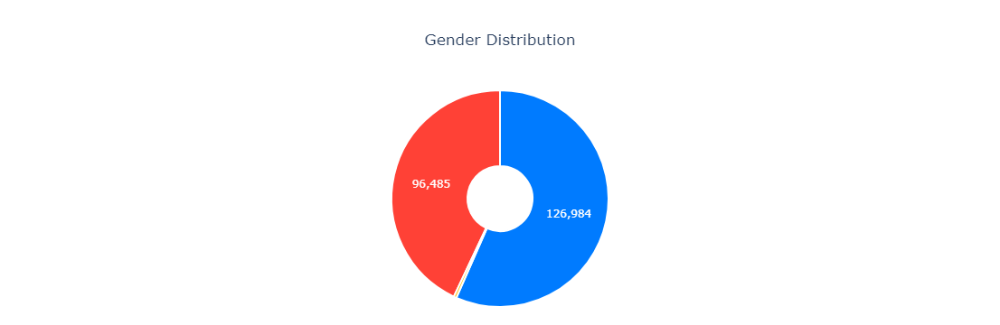

In [43]:
# Count the occurrences of each gender in the user dataset
gender_counts = df_user['Gender'].value_counts(dropna=True)

# Define custom colors for the pie slices
colors = ['rgb(0, 123, 255)', 'rgb(255, 65, 54)', 'rgb(255, 187, 0)', 'rgb(125, 125, 125)']

# Create the pie plot
fig = go.Figure()

# Add a pie chart trace to the figure
fig.add_trace(go.Pie(
    labels=gender_counts.index,  # Set labels for pie slices
    values=gender_counts.values,  # Set values for each slice
    hole=0.3,  # Set the size of the center hole
    marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)),  # Set colors and borders
    hoverinfo='label+percent',  # Show label and percentage on hover
    hovertemplate='<b>%{label}</b><br>%{percent}',  # Customize hover template
    textinfo='value',  # Show the value of each slice
    textposition='inside',  # Position the text inside the slices
    sort=False  # Maintain the order of the counts
))

# Customize the layout of the plot
fig.update_layout(
    title='Gender Distribution',  # Set the title of the plot
    title_x=0.5,  # Center the title
    uniformtext_minsize=12,  # Set minimum text size
    uniformtext_mode='hide',  # Hide text when too small to fit
    showlegend=False,  # Hide legend
    paper_bgcolor='rgba(0,0,0,0)',  # Set background color for the plot area
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color for the plot
    margin=dict(l=20, r=20, t=100, b=20),  # Set margins
)

# Show the plot
fig.show()

In [44]:
# Count the occurrences of each birthday value in the user dataset while dropping missing values
birthday_counts = df_user['Birthday'].value_counts(dropna=True)
birthday_counts

1990-01-01T00:00:00+00:00    177
1989-03-26T00:00:00+00:00    169
1980-01-01T00:00:00+00:00    166
1930-01-01T00:00:00+00:00    153
1991-01-01T00:00:00+00:00    115
                            ... 
1966-12-06T00:00:00+00:00      1
2001-11-08T00:00:00+00:00      1
1954-10-16T00:00:00+00:00      1
1958-03-13T00:00:00+00:00      1
2000-10-13T00:00:00+00:00      1
Name: Birthday, Length: 11247, dtype: int64

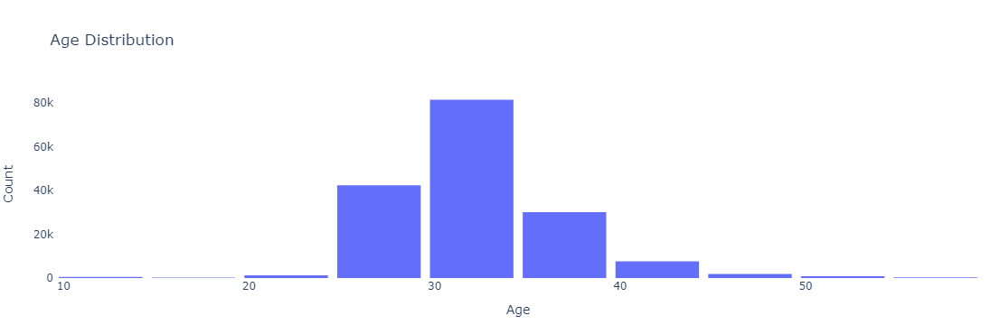

In [45]:
# Define a function to calculate age from the birth date
def calculate_age(birth_date):
    if birth_date != 'NaN':
        try:
            # Extract the birth year from the date string
            birth_year = int(birth_date.split('-')[0])
            # Get the current year
            today_year = datetime.utcnow().year
            # Calculate the age
            age = today_year - birth_year
            # Check for a valid age range (adjust as needed)
            if age >= 10 and age < 60:
                return age
            else:
                return None
        except:
            return None
    return None

# Apply age calculation to the 'Birthday' column after dropping missing values
Age = df_user['Birthday'].dropna().apply(calculate_age)

# Create a histogram to visualize the age distribution
fig = px.histogram(Age, nbins=20, title='Age Distribution', labels={'value': 'Age', 'count': 'Count'})

# Customize the layout of the histogram
fig.update_layout(
    xaxis=dict(title='Age'),
    yaxis=dict(title='Count'),
    bargap=0.1,
    showlegend=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    margin=dict(l=50, r=20, t=100, b=50),
)

# Display the histogram plot
fig.show()

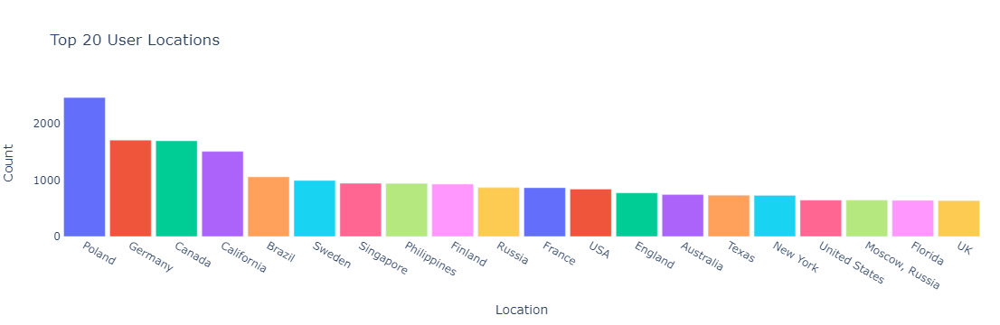

In [46]:
# Count the occurrences of each user location
location_counts = df_user['Location'].value_counts()

# Create a bar chart to visualize the top 20 user locations
fig = px.bar(
    location_counts.head(20),  # Extract the top 20 user locations
    x=location_counts.head(20).index,  # Set the x-axis values as the user locations
    y=location_counts.head(20).values,  # Set the y-axis values as the counts of each location
    labels={'x': 'Location', 'y': 'Count'},  # Assign labels to the axes
    title='Top 20 User Locations',  # Set the title of the chart
    color=location_counts.head(20).index  # Add color differentiation based on locations
)

# Customize the layout of the bar chart
fig.update_layout(
    xaxis=dict(title='Location'),  # Set the x-axis title as 'Location'
    yaxis=dict(title='Count'),  # Set the y-axis title as 'Count'
    bargap=0.1,  # Set the gap between bars in the chart
    showlegend=False,  # Hide the legend in the chart
    paper_bgcolor='rgba(0,0,0,0)',  # Set the background color of the plot area to transparent
    plot_bgcolor='rgba(0,0,0,0)',  # Set the background color of the entire plot to transparent
    margin=dict(l=50, r=20, t=100, b=50),  # Adjust margins to position the chart appropriately
)

# Display the bar chart
fig.show()

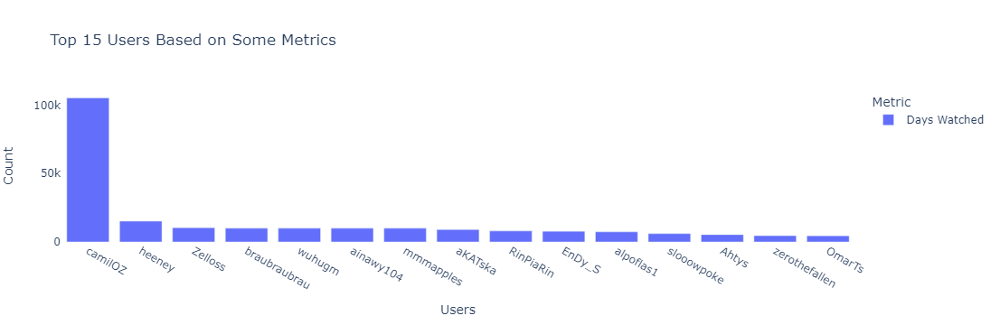

In [47]:
# Define the metrics you want to consider for top users
metrics = ['Days Watched']
# You can change the metrics to 'Mean Score', 'Watching', 'Completed', 'On Hold', 'Dropped', 'Plan to Watch' or include
# a combination of them to see the comparison b/w them such as Watching vs. Completed

# Initialize an empty DataFrame to store the top users
top_users = pd.DataFrame()

for metric in metrics:
    # Extract the top 15 users based on the specified metric
    top_users = pd.concat([top_users, df_user.nlargest(15, metric)], ignore_index=True)

# Create a grouped bar chart for the top users based on the chosen metrics
fig = px.bar(
    top_users,  # Dataframe containing top users
    x='Username',  # X-axis represents usernames
    y=metrics,  # Y-axis represents chosen metrics
    barmode='group',  # Grouped bars for comparison
    title='Top 15 Users Based on Some Metrics',  # Set the title of the chart
    labels={'value': 'Count', 'variable': 'Metric'},  # Labels for axes
    color_discrete_sequence=px.colors.qualitative.Plotly  # Set color palette
)

# Customize the layout of the bar chart
fig.update_layout(
    xaxis=dict(title='Users'),  # Set the x-axis title as 'Users'
    yaxis=dict(title='Count'),  # Set the y-axis title as 'Count'
    legend_title_text='Metric',  # Set the legend title
    paper_bgcolor='rgba(0,0,0,0)',  # Set the background color of the plot area to transparent
    plot_bgcolor='rgba(0,0,0,0)',  # Set the background color of the entire plot to transparent
    margin=dict(l=50, r=20, t=100, b=50),  # Adjust margins to position the chart appropriately
)

# Display the bar chart
fig.show()

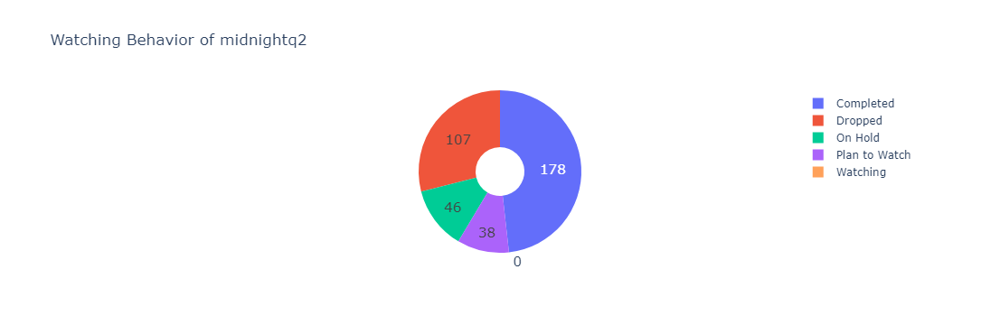

In [48]:
# Function to get watching behavior of a specific user
def get_watching_behavior(username):
    user_data = df_user[df_user['Username'] == username]  # Filter user data by username
    if len(user_data) == 0:  # Check if the username doesn't exist in the dataset
        return None
    # Extract watching behavior metrics for the user
    watching = user_data['Watching'].values[0]
    on_hold = user_data['On Hold'].values[0]
    completed = user_data['Completed'].values[0]
    dropped = user_data['Dropped'].values[0]
    plan_to_watch = user_data['Plan to Watch'].values[0]
    return watching, on_hold, completed, dropped, plan_to_watch

# Replace username_input with the actual username or uncomment the input line to take user input
username_input = "midnightq2"  # Input the username directly for demonstration

# Get the watching behavior of the user by calling the function
watching, on_hold, completed, dropped, plan_to_watch = get_watching_behavior(username_input)

# Create the pie chart to display the user's watching behavior
fig = go.Figure(data=[go.Pie(
    labels=['Watching', 'On Hold', 'Completed', 'Dropped', 'Plan to Watch'],  # Define labels for the pie chart
    values=[watching, on_hold, completed, dropped, plan_to_watch],  # Define values for the pie chart
    hole=0.3,  # Set the size of the inner hole to create a donut shape
    hoverinfo='label+percent',  # Show label and percentage on hover
    textinfo='value',  # Show the numerical value as text
    textfont_size=15  # Set the font size for the text
)])

# Customize the layout of the pie chart
fig.update_layout(
    title=f"Watching Behavior of {username_input}",  # Set the title of the plot
    showlegend=True,  # Show the legend
    paper_bgcolor='rgba(0,0,0,0)',  # Set the background color of the plot area to transparent
    plot_bgcolor='rgba(0,0,0,0)'  # Set the background color of the entire plot to transparent
)

# Show the pie chart
fig.show()


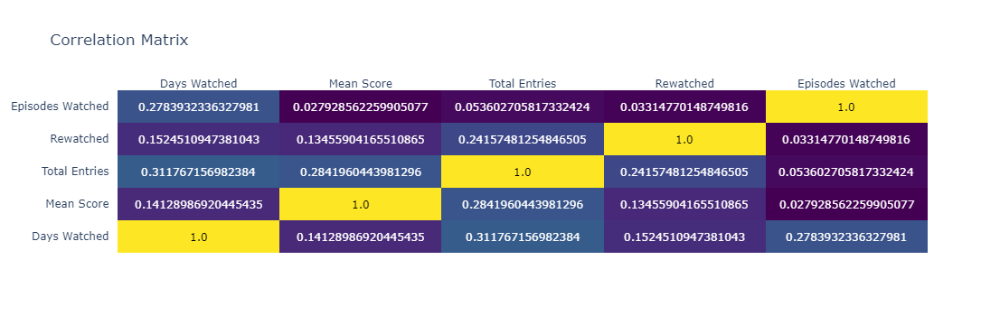

In [49]:
# Create a correlation matrix based on specific columns of the user DataFrame
correlation_matrix = df_user[['Days Watched', 'Mean Score', 'Total Entries', 'Rewatched', 'Episodes Watched']].corr()

# Create a heatmap visualizing the correlation matrix using Plotly's annotated heatmap
fig = ff.create_annotated_heatmap(z=correlation_matrix.values,  # Assign correlation matrix values as heatmap data
                                  x=list(correlation_matrix.columns),  # Set the x-axis labels
                                  y=list(correlation_matrix.index),  # Set the y-axis labels
                                  colorscale='Viridis')  # Define the colorscale for the heatmap

# Customize the layout and title of the heatmap
fig.update_layout(title='Correlation Matrix')

# Show the heatmap
fig.show()

### For User Score Dataset

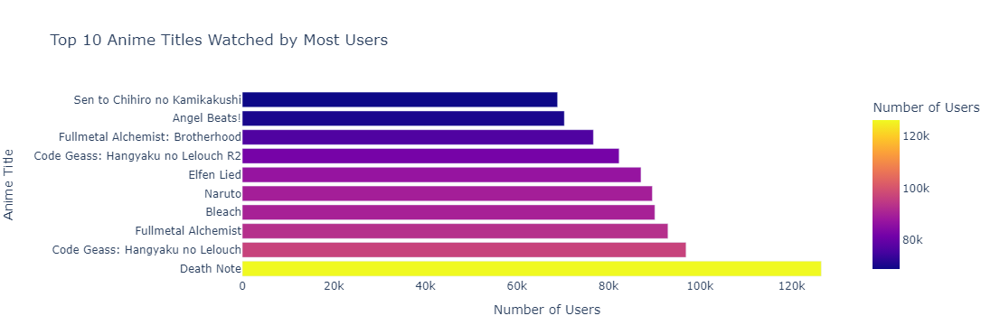

In [50]:
# Calculate the count of users who watched each anime title from the df_score dataset
anime_watch_count = df_score.groupby('Anime Title')['user_id'].nunique().reset_index()
anime_watch_count = anime_watch_count.rename(columns={'user_id': 'User Count'})  # Rename the user_id column

# Sort the DataFrame in descending order based on the number of users who watched each anime
anime_watch_count = anime_watch_count.sort_values(by='User Count', ascending=False)

# Select the top 'top_n' anime titles with the highest number of users
top_n = 10  # Define the number of top anime titles to display
top_anime_watch_count = anime_watch_count.head(top_n)

# Define a colorful color palette for the bar chart
color_palette = px.colors.qualitative.Plotly

# Create a horizontal bar chart showing the top anime titles watched by the most users
fig = px.bar(top_anime_watch_count, x='User Count', y='Anime Title', orientation='h',
             title=f'Top {top_n} Anime Titles Watched by Most Users',
             labels={'User Count': 'Number of Users', 'Anime Title': 'Anime Title'},
             color='User Count',  # Assign color based on the number of users
             color_discrete_sequence=color_palette)  # Set color palette for the bars

# Customize the layout of the plot
fig.update_layout(showlegend=False, paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)',
                  margin=dict(l=50, r=20, t=100, b=50))  # Set plot margins and background colors

# Show the generated plot
fig.show()

## Our exploration of anime data comes to an end. I trust this journey has been insightful and enjoyable. 
## Happy analyzing, and may your exploration of the captivating anime world continue! Now, onwards to our model training in notebook2!